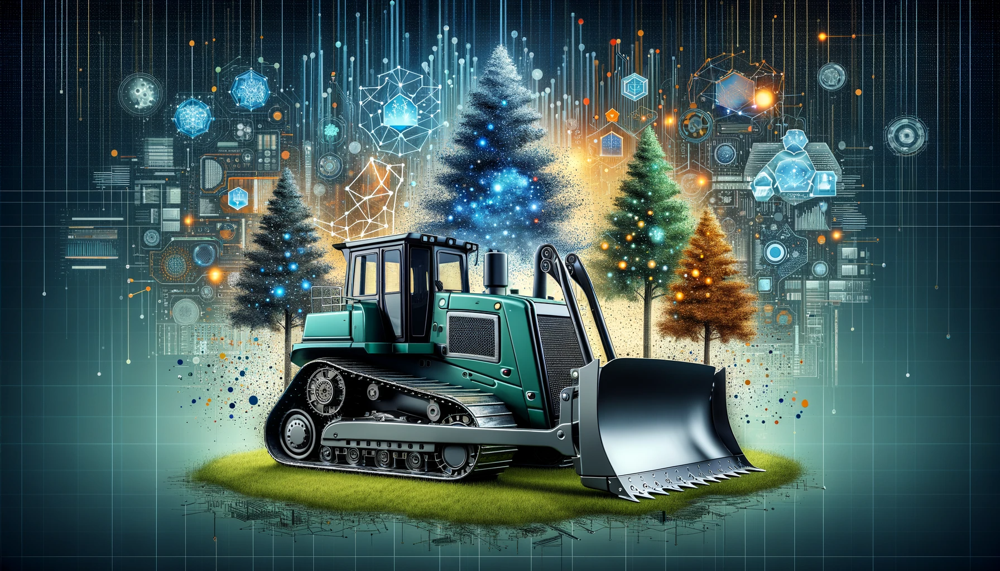
_This image was created with the assistance of DALL·E_ 


# APPROACH 4: RANDOM FOREST

## 1. INTRODUCTION

The goal of this project is to predict the sale price of a particular piece of heavy equiment at auction based on it's usage, equipment type, and configuaration.  The data is sourced from auction result postings and includes information on usage and equipment configurations.

The data is originally sourced from a **[Kaggle](https://www.kaggle.com/competitions/bluebook-for-bulldozers/data)** competetition, hosted 11 years ago by Fast Iron to create a "blue book for bull dozers," for customers to assess what their heavy equipment fleet is worth at auction.  

In this notebook, we will try to predict the sale price of bulldozer using **Random Forest** algorithm. 


<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">1.1. PROBLEM DEFINITION/GOAL</h4>

* Given that we are trying to predict a number, the problem we are exploring is a **Regression** problem.<br>
* Our goal is to forecast the future sale price of a bulldozer based on its features as well as the prices of similar bulldozers that have previously been sold.


<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">1.2. DATA SOURCE</h4>

The data was obtained from the **[Kaggle](https://www.kaggle.com/competitions/bluebook-for-bulldozers/data)** Bluebook for Bulldozers competition and it contains 3 main datasets:
* **Train.csv** It is the training set, which contains data through the end of 2011. It includes thes `SalePrice`, which is the target variable.
* **Valid.csv** It is the Validation set, which contains data from January 1, 2012 - April 30, 2012. 
* **Test.csv** It is the test set, which contains data from May 1, 2012 - November 2012. It does not contain the `SalePrice` attribute, since this is the what we'll try to predict.


<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">1.3. EVALUATION</h4>

The evaluation benchmark for this project is the **[RMSLE](https://www.kaggle.com/competitions/bluebook-for-bulldozers/overview/evaluation)** (root mean squared log error) between the actual and predicted auction prices.
Root Mean Squared Logarithmic Error is calculated by applying log to the actual and the predicted values and then taking their differences. RMSLE is robust to outliers where the small and the large errors are treated evenly.

It penalizes the model more if the predicted value is less than the actual value while the model is less penalized if the predicted value is more than the actual value. It does not penalize high errors due to the log. Hence the model has a large penalty for underestimation than overestimation. This can be helpful in situations where we are not bothered by overestimation but underestimation is not acceptable, which is the case here. Customers should not be given an underestimation of the worth of their heavy equipment fleet at auctions, thus saving them from potential loss.

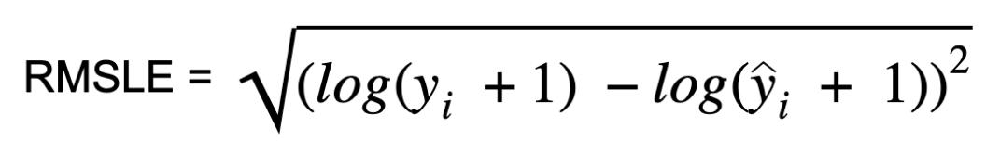


$\hat{y}_{i}$ is the predicted value of the target for instance (i),

$y_{i}$ is the actual value of the target for instance (i),

and, log is the natural logarithm.

Picking an appropriate evaluation metric is very important in Machine Learning. We will be using **RMSLE** as evaluation Metric as it is suggested by Kaggle itself and was used to rank the models in the original competition. This would give us a sense regarding how well are we performing as compared to the models submitted during the competetion. Our goal is to get the RMSLE value as low as possible.

<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">1.4. FEATURES</h4>

The first few features in the dataset are as below:
* **SalesID:** Unique identifier of a particular sale of a machine at auction
* **MachineID:** Identifier for a particular machine;  machines may have multiple sales
* **ModelID:** Identifier for a unique machine model (i.e. fiModelDesc)
* **Datasource:** Source of the sale record;  some sources are more diligent about reporting attributes of the machine than others.  Note that a particular datasource may report on multiple auctioneerIDs.
* **auctioneerID:** Identifier of a particular auctioneer, i.e. company that sold the machine at auction.  Not the same as datasource.
* **YearMade:** Year of manufacturer of the Machine
* **MachineHoursCurrentMeter:** Current usage of the machine in hours at time of sale (saledate);  null or 0 means no hours have been reported for that sale
* **UsageBand:** Value (low, medium, high) calculated comparing this particular Machine-Sale hours to average usage for the fiBaseModel;  e.g. 'Low' means this machine has less hours given it's lifespan relative to average of fiBaseModel.
* **Saledate:** Time of sale
* **Saleprice:** Cost of sale in USD

The complete data dictionary can be viewed **[here](https://docs.google.com/spreadsheets/d/1vslmSkFUnyNdC177hA1MfIMk5gd_hZbEM1-OBlpubNY/edit?usp=sharing)**.


## 2. PROCESSING DATA FOR MODELING

<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.1. LOADING THE TOOLS</h4>

In [1]:
#ignoring warnings
import warnings
warnings.filterwarnings('ignore')

import os
import matplotlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
%matplotlib inline

#The following settings will improve the default style and font sizes for our charts.

sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(15,7)})
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [2]:
# Read in the data here
df = pd.read_csv("/Users/amna/Desktop/ML Project/TrainAndValid.csv")
df

,SalesID,SalePrice,MachineID,ModelID,datasource,auctioneerID,YearMade,MachineHoursCurrentMeter,UsageBand,saledate,...,Undercarriage_Pad_Width,Stick_Length,Thumb,Pattern_Changer,Grouser_Type,Backhoe_Mounting,Blade_Type,Travel_Controls,Differential_Type,Steering_Controls
0,1139246,66000.0,999089,3157,121,3.0,2004,68.0,Low,11/16/2006 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,Conventional
1,1139248,57000.0,117657,77,121,3.0,1996,4640.0,Low,3/26/2004 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,Conventional
2,1139249,10000.0,434808,7009,121,3.0,2001,2838.0,High,2/26/2004 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1139251,38500.0,1026470,332,121,3.0,2001,3486.0,High,5/19/2011 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1139253,11000.0,1057373,17311,121,3.0,2007,722.0,Medium,7/23/2009 0:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412693,6333344,10000.0,1919201,21435,149,2.0,2005,NaN,NaN,3/7/2012 0:00,...,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN
412694,6333345,10500.0,1882122,21436,149,2.0,2005,NaN,NaN,1/28/2012 0:00,...,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN
412695,6333347,12500.0,1944213,21435,149,2.0,2005,NaN,NaN,1/28/2012 0:00,...,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN
412696,6333348,10000.0,1794518,21435,149,2.0,2006,NaN,NaN,3/7/2012 0:00,...,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN


Each row shows the measurements for a given date for a particular bulldozer auction. The column "SalePrice" contains the value to be predicted.

Let's check the column types of the dataset.

In [3]:
df.describe()

,SalesID,SalePrice,MachineID,ModelID,datasource,auctioneerID,YearMade,MachineHoursCurrentMeter
count,4.126980e+05,412698.000000,4.126980e+05,412698.000000,412698.000000,392562.000000,412698.000000,1.475040e+05
mean,2.011161e+06,31215.181414,1.230061e+06,6947.201828,135.169361,6.585268,1899.049637,3.522988e+03
std,1.080068e+06,23141.743695,4.539533e+05,6280.824982,9.646749,17.158409,292.190243,2.716993e+04
min,1.139246e+06,4750.000000,0.000000e+00,28.000000,121.000000,0.000000,1000.000000,0.000000e+00
25%,1.421898e+06,14500.000000,1.088593e+06,3261.000000,132.000000,1.000000,1985.000000,0.000000e+00
50%,1.645852e+06,24000.000000,1.284397e+06,4605.000000,132.000000,2.000000,1995.000000,0.000000e+00
75%,2.261012e+06,40000.000000,1.478079e+06,8899.000000,136.000000,4.000000,2001.000000,3.209000e+03
max,6.333349e+06,142000.000000,2.486330e+06,37198.000000,173.000000,99.000000,2014.000000,2.483300e+06


<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.2. VISUALIZATION</h4>


Let's explore the data by visualizing the distribution of values in some columns of the dataset, and the relationships between "saleprice" and other columns. We have used first 4 columns of the dataset to plot the histograms


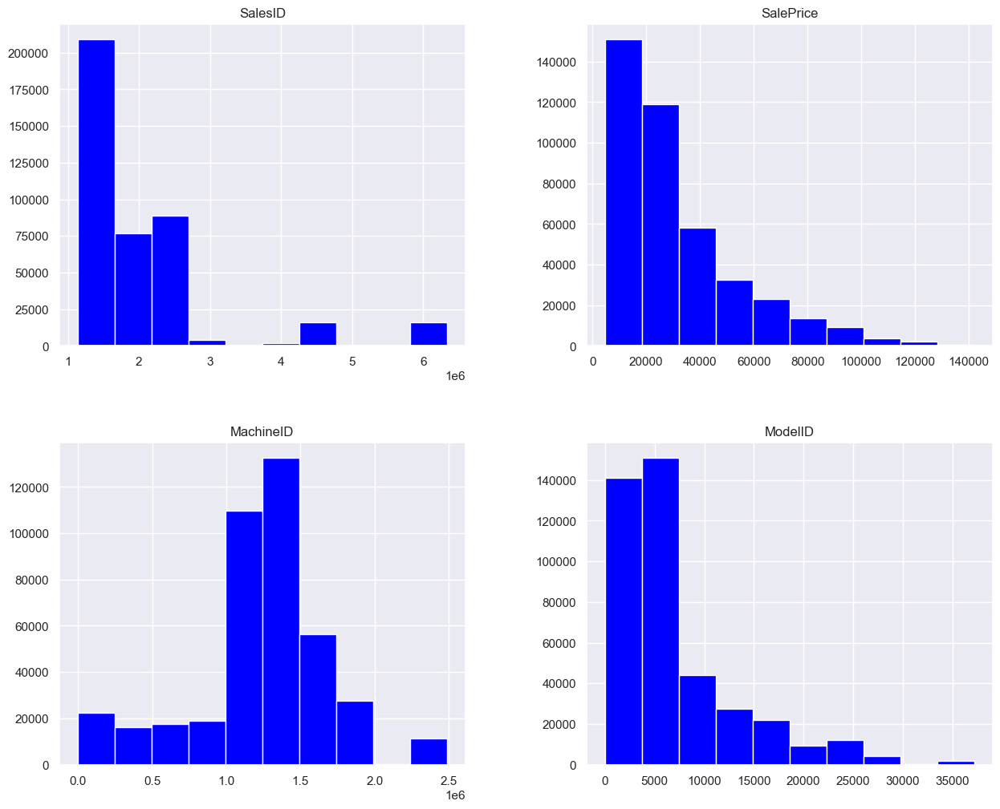

In [4]:
# Selecting the first 4 columns, and can adjust this based on our requirements
selected_columns = df.columns[:4]  

# Using the selected_columns to filter the DataFrame
df[selected_columns].hist(bins=10, figsize=(15, 12),color='blue') 
plt.show()


<h4 style="background-color:#0b0506;color:white;border-radius: 8px; padding:12px">2.3. DATA CLEANING</h4>

Based on the above data, now we will check that which columns have more 0 values and we will remove those values in the below cells as a part of data pre-processing.

<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.3.1 Machine Hours Current Meter</h5>

For the "Machine hours current meter" feature, if the value is 0 then we will remove it. The auction is typically held for used equipment and zero values can be attributed to errors in the data collections.


In [5]:
Workdf = df[df.MachineHoursCurrentMeter != 0].copy()
Workdf.shape

(338864, 53)

<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.3.2 Manufacturing Date</h5>

According to our research, bulldozers were built only after **[1900s](https://www.thoughtco.com/history-of-the-bulldozer-1991353)**. However, we do have data <1900 in our dataset which must be errornous. We will consider only the ones made after 1900 and discrad the older ones. 


In [6]:
yeardf = Workdf[Workdf.YearMade >= 1900].copy()

In [7]:
px.histogram(yeardf, x='YearMade', title='Manufacturing Year')

Similarly, we can analyze many more options like the **Sales Price** vs **Total Hours Worked by a Machine** , **Sales Price** vs the **Location of Machine** or the **Sales Price** vs the **Manufacturing Group**.

Now we will move towards the data cleaning and pre-processing since it is a very essential part of the model.

In [8]:
# removing the YearMade for which manufacturing is before 1900
df = df[df['YearMade'] >= 1900] 
# removing the MachineHoursCurrentMeter for which working hours are greater than 50000
df = df[df['MachineHoursCurrentMeter'] <= 50000] 
df = df[df['MachineHoursCurrentMeter'] != 0]

df.shape

(67855, 53)

<h4 style="background-color:#0b0506;color:white;border-radius: 8px; padding:12px">2.4. FEATURE ENGINEERING</h4>

Let us take a look at the information provided by the data

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67855 entries, 0 to 412642
Data columns (total 53 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   SalesID                   67855 non-null  int64  
 1   SalePrice                 67855 non-null  float64
 2   MachineID                 67855 non-null  int64  
 3   ModelID                   67855 non-null  int64  
 4   datasource                67855 non-null  int64  
 5   auctioneerID              63728 non-null  float64
 6   YearMade                  67855 non-null  int64  
 7   MachineHoursCurrentMeter  67855 non-null  float64
 8   UsageBand                 67855 non-null  object 
 9   saledate                  67855 non-null  object 
 10  fiModelDesc               67855 non-null  object 
 11  fiBaseModel               67855 non-null  object 
 12  fiSecondaryDesc           46688 non-null  object 
 13  fiModelSeries             10554 non-null  object 
 14  fiMod

<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.4.1 Features Removal</h5>

We can see that there are numerous null values in the dataset. We will try to remove the features that contain ~80% null values, since they would not contribute much towards the final prediction. 
To validate our choice, we compared the loss in either case: "All features" vs "Features with less than 80% null values", while keeping everything constant and we did not find any improvement. On the contrary, removing redundant features can improve the efficiency of our model, reducing the training time as well. 

In [10]:
df.columns #all the columns in the dataset

Index(['SalesID', 'SalePrice', 'MachineID', 'ModelID', 'datasource',
       'auctioneerID', 'YearMade', 'MachineHoursCurrentMeter', 'UsageBand',
       'saledate', 'fiModelDesc', 'fiBaseModel', 'fiSecondaryDesc',
       'fiModelSeries', 'fiModelDescriptor', 'ProductSize',
       'fiProductClassDesc', 'state', 'ProductGroup', 'ProductGroupDesc',
       'Drive_System', 'Enclosure', 'Forks', 'Pad_Type', 'Ride_Control',
       'Stick', 'Transmission', 'Turbocharged', 'Blade_Extension',
       'Blade_Width', 'Enclosure_Type', 'Engine_Horsepower', 'Hydraulics',
       'Pushblock', 'Ripper', 'Scarifier', 'Tip_Control', 'Tire_Size',
       'Coupler', 'Coupler_System', 'Grouser_Tracks', 'Hydraulics_Flow',
       'Track_Type', 'Undercarriage_Pad_Width', 'Stick_Length', 'Thumb',
       'Pattern_Changer', 'Grouser_Type', 'Backhoe_Mounting', 'Blade_Type',
       'Travel_Controls', 'Differential_Type', 'Steering_Controls'],
      dtype='object')

In [11]:
# removing all the extra columns which we think that have not any significance in the price predictions
df = df.drop(['SalesID','MachineID','auctioneerID', 'fiSecondaryDesc','fiModelSeries', 'fiModelDescriptor','fiProductClassDesc',
              'Drive_System', 'Forks', 'Pad_Type', 'Ride_Control', 'Stick', 'Transmission', 'Turbocharged', 'Blade_Extension',
              'Blade_Width', 'Enclosure_Type', 'Engine_Horsepower', 'Pushblock', 'Ripper', 'Scarifier', 'Tip_Control',
              'Tire_Size','Coupler', 'Coupler_System', 'Grouser_Tracks', 'Hydraulics_Flow', 'Track_Type',
              'Undercarriage_Pad_Width', 'Stick_Length', 'Thumb','Pattern_Changer', 'Grouser_Type', 'Backhoe_Mounting',
              'Blade_Type','Travel_Controls', 'Differential_Type', 'Steering_Controls', 'fiModelDesc', 'fiBaseModel',], axis=1)

# display the resulting dataframe
df.head(10)

,SalePrice,ModelID,datasource,YearMade,MachineHoursCurrentMeter,UsageBand,saledate,ProductSize,state,ProductGroup,ProductGroupDesc,Enclosure,Hydraulics
0,66000.0,3157,121,2004,68.0,Low,11/16/2006 0:00,NaN,Alabama,WL,Wheel Loader,EROPS w AC,2 Valve
1,57000.0,77,121,1996,4640.0,Low,3/26/2004 0:00,Medium,North Carolina,WL,Wheel Loader,EROPS w AC,2 Valve
2,10000.0,7009,121,2001,2838.0,High,2/26/2004 0:00,NaN,New York,SSL,Skid Steer Loaders,OROPS,Auxiliary
3,38500.0,332,121,2001,3486.0,High,5/19/2011 0:00,Small,Texas,TEX,Track Excavators,EROPS w AC,2 Valve
4,11000.0,17311,121,2007,722.0,Medium,7/23/2009 0:00,NaN,New York,SSL,Skid Steer Loaders,EROPS,Auxiliary
5,26500.0,4605,121,2004,508.0,Low,12/18/2008 0:00,NaN,Arizona,BL,Backhoe Loaders,OROPS,NaN
6,21000.0,1937,121,1993,11540.0,High,8/26/2004 0:00,Large / Medium,Florida,TEX,Track Excavators,EROPS,Standard
7,27000.0,3539,121,2001,4883.0,High,11/17/2005 0:00,NaN,Illinois,BL,Backhoe Loaders,OROPS,NaN
8,21500.0,36003,121,2008,302.0,Low,8/27/2009 0:00,Mini,Texas,TEX,Track Excavators,EROPS,Auxiliary
10,24000.0,4605,121,2004,1414.0,Medium,8/21/2008 0:00,NaN,Oregon,BL,Backhoe Loaders,OROPS,NaN


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67855 entries, 0 to 412642
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   SalePrice                 67855 non-null  float64
 1   ModelID                   67855 non-null  int64  
 2   datasource                67855 non-null  int64  
 3   YearMade                  67855 non-null  int64  
 4   MachineHoursCurrentMeter  67855 non-null  float64
 5   UsageBand                 67855 non-null  object 
 6   saledate                  67855 non-null  object 
 7   ProductSize               32294 non-null  object 
 8   state                     67855 non-null  object 
 9   ProductGroup              67855 non-null  object 
 10  ProductGroupDesc          67855 non-null  object 
 11  Enclosure                 67825 non-null  object 
 12  Hydraulics                55278 non-null  object 
dtypes: float64(2), int64(3), object(8)
memory usage: 7.2+ MB


<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.4.2 Features Addition</h5>

The **saledate** feature is an interesting one, as mentioned in the project's propositions as well. We went through the **[discussion](https://www.kaggle.com/competitions/bluebook-for-bulldozers/discussion/4368)** section of the original competetion to see what approaches did the participants use, including the winners. After going through the dicussion we decided to convert 'saledate' to datetime type and use it to create **'saleYear', 'saleMonth', 'saleDay', 'saleDayOfWeek'** and **'saleDayOfYear'**. I addition to this, we also created a new feature called **'Age'** of the bulldozer.


In [13]:
# Create a copy df
rdf = df.copy()

# Convert 'saledate' to datetime type
rdf['saledate'] = pd.to_datetime(rdf['saledate'])

# Enriching the dataframe with 'saleYear', 'saleMonth', 'saleDay', 'saleDayOfWeek' and 'saleDayOfYear'
rdf["saleYear"]      = rdf.saledate.dt.year
rdf["saleMonth"]     = rdf.saledate.dt.month
rdf["saleDay"]       = rdf.saledate.dt.day
rdf["saleDayOfWeek"] = rdf.saledate.dt.dayofweek


In [14]:
# Add a column for age of bulldozer
rdf['age'] = rdf['saleYear'] - rdf['YearMade']

<h4 style="background-color:#0b0506;color:white;border-radius: 8px; padding:12px">2.5. MISSING VALUES</h4>

Next we handle the missing values. Following will give us an overview of the features that contain missing values. 

In [15]:
rdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67855 entries, 0 to 412642
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   SalePrice                 67855 non-null  float64       
 1   ModelID                   67855 non-null  int64         
 2   datasource                67855 non-null  int64         
 3   YearMade                  67855 non-null  int64         
 4   MachineHoursCurrentMeter  67855 non-null  float64       
 5   UsageBand                 67855 non-null  object        
 6   saledate                  67855 non-null  datetime64[ns]
 7   ProductSize               32294 non-null  object        
 8   state                     67855 non-null  object        
 9   ProductGroup              67855 non-null  object        
 10  ProductGroupDesc          67855 non-null  object        
 11  Enclosure                 67825 non-null  object        
 12  Hydraulics       

We replaces all missing values in the each column with the most frequently occurring value in that column, i.e. **mode**. 

**_Why using Mode is a good idea?_**

**Categorical Data**: For categorical variables, using the mode to fill missing values can be more appropriate than other measures like mean or median. This is because the mode represents the most common category.

**Maintaining Data Integrity**: Using the mode helps to ensure that the filled values are valid entries for the category. For instance, if ProductSize can only take certain discrete values, replacing missing values with the mode guarantees that the filled values will be one of these valid categories.

**Minimal Distortion**: For categorical data, using the mode to fill missing values can minimally distort the distribution of the data. It maintains the original most frequent category, which might be important for analysis.

**Simple and Fast**: Computing the mode is a straightforward and computationally efficient process, making it a practical choice for large datasets.

However, it's important to note that this method of handling missing data has its limitations and may not always be the best approach. Even though we obtained reasonable results using mode, but other approaches for handling missing values may yield slightly better results. 

In [16]:
# impute missing values with mode
rdf['ProductSize'] = rdf['ProductSize'].fillna(rdf['ProductSize'].mode()[0])
rdf['Enclosure'] = rdf['Enclosure'].fillna(rdf['Enclosure'].mode()[0])
rdf['Hydraulics'] = rdf['Hydraulics'].fillna(rdf['Hydraulics'].mode()[0])

rdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67855 entries, 0 to 412642
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   SalePrice                 67855 non-null  float64       
 1   ModelID                   67855 non-null  int64         
 2   datasource                67855 non-null  int64         
 3   YearMade                  67855 non-null  int64         
 4   MachineHoursCurrentMeter  67855 non-null  float64       
 5   UsageBand                 67855 non-null  object        
 6   saledate                  67855 non-null  datetime64[ns]
 7   ProductSize               67855 non-null  object        
 8   state                     67855 non-null  object        
 9   ProductGroup              67855 non-null  object        
 10  ProductGroupDesc          67855 non-null  object        
 11  Enclosure                 67855 non-null  object        
 12  Hydraulics       

In [17]:
rdf.isna().sum()

SalePrice                   0
ModelID                     0
datasource                  0
YearMade                    0
MachineHoursCurrentMeter    0
UsageBand                   0
saledate                    0
ProductSize                 0
state                       0
ProductGroup                0
ProductGroupDesc            0
Enclosure                   0
Hydraulics                  0
saleYear                    0
saleMonth                   0
saleDay                     0
saleDayOfWeek               0
age                         0
dtype: int64

In [18]:
# Sort DataFrame in date order
rdf.sort_values(by=["saledate"],inplace=True,ascending=True)

<h4 style="background-color:#0b0506;color:white;border-radius: 8px; padding:12px">2.6. DATA PREPERATION FOR TRAINING</h4>

In preparing our dataset for training, we will carry out a series of steps to ensure it's optimally structured for our machine learning models. We'll begin by **dividing the dataset into training, test, and validation sets**, which is a critical step for testing and validating the model's performance. Next, we'll identify which columns in our dataset will serve as input features and which will be our target variable. Following this, we'll distinguish between numeric and categorical columns within our dataset. This distinction is vital because it guides us in applying the appropriate preprocessing techniques to each type of data.
We'll **scale our numeric values** to a uniform range, which is an important step in helping our model efficiently interpret these values. 
Lastly, we'll transform the categorical columns into **one-hot vectors** by encoding them. This process converts the categorical data into a format that's more understandable and usable by our machine learning algorithms, thereby enhancing the overall efficacy of the model we are training. 


In [19]:
rdf.saledate.min(), rdf.saledate.max()

(Timestamp('1989-02-01 00:00:00'), Timestamp('2012-04-27 00:00:00'))

In [20]:
rdf['saledate_obj'] = rdf['saledate'].dt.strftime('%Y-%m-%d %H:%M:%S')

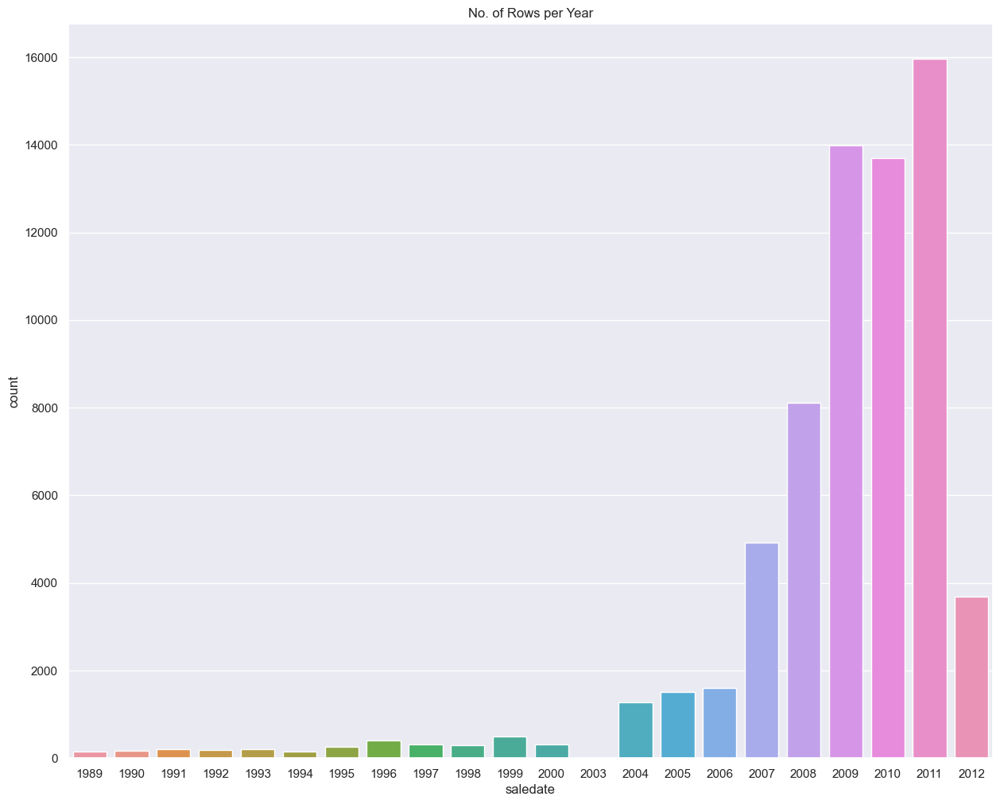

In [21]:
# Create a countplot with larger figure size
plt.figure(figsize=(15, 12))

plt.title('No. of Rows per Year')
sns.countplot(x=pd.to_datetime(rdf.saledate).dt.year);

<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.6.1 Splitting Data</h5>

When handling chronological or time-series data in machine learning, it's crucial to organize the training, validation, and test sets based on the temporal sequence of the data. This approach ensures that our model is trained on historical data and then evaluated on future data, mirroring how it would be used in real-world scenarios. 

In our specific case, we will structure our dataset chronologically for training and testing. The data up to the year 2011 will be designated for the training set, allowing the model to learn from past patterns and trends. For the validation set, which is essential for tuning the model and preventing overfitting, we'll use data from the year 2011. This step acts as a bridge between training and testing, ensuring that the model can generalize beyond the training data but still before the future unseen data. Finally, for the test set, we'll use data from the year 2012 onwards. This will be our untouched dataset, serving as a real-world scenario where the model's predictive performance on future data is evaluated, giving us a true sense of its effectiveness and accuracy in a practical setting.

In [22]:
# Drop the 'saledate_obj' column in-place
rdf.drop('saledate_obj', axis=1, inplace=True)

In [23]:
year = pd.to_datetime(rdf.saledate).dt.year

train_df = rdf[year < 2011]
val_df = rdf[year == 2011]
test_df = rdf[year > 2011]

In [24]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (48217, 18)
val_df.shape : (15959, 18)
test_df.shape : (3679, 18)


<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.6.2 Input and Target Columns</h5>

Let's determine which columns in our dataset will serve as inputs and which will be the target. We understand from our dataset analysis that the column we aim to predict is SalePrice.Therefore, we'll treat SalePrice as our target  column, while all other columns will be regarded as input columns.


In [25]:
input_cols = list(train_df.columns)[1:]
target_col = 'SalePrice'

In [26]:
print(input_cols)

['ModelID', 'datasource', 'YearMade', 'MachineHoursCurrentMeter', 'UsageBand', 'saledate', 'ProductSize', 'state', 'ProductGroup', 'ProductGroupDesc', 'Enclosure', 'Hydraulics', 'saleYear', 'saleMonth', 'saleDay', 'saleDayOfWeek', 'age']


In [27]:
print(target_col)

SalePrice


In [28]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [29]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [30]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.6.3 Feature types</h5>

Now we'll identify each feature in our dataset as either numeric or categorical. This distinction is essential for the next steps in our data preprocessing. 

**For the numeric features**, we will apply scaling techniques. Scaling these values ensures that all numerical data falls within a comparable range, which is important for many machine learning algorithms as it allows them to interpret the data more effectively. 

**For the categorical features**,on the other hand,  we will employ one-hot encoding. This process converts categorical variables into a format that's easier for machine learning models to understand, transforming them into a series of binary columns that represent each category uniquely. 

By treating numeric and categorical features appropriately, we enhance the overall predictive power and efficiency of our model.

In [31]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [32]:
print(numeric_cols)

['ModelID', 'datasource', 'YearMade', 'MachineHoursCurrentMeter', 'saleYear', 'saleMonth', 'saleDay', 'saleDayOfWeek', 'age']


In [33]:
print(categorical_cols)

['UsageBand', 'ProductSize', 'state', 'ProductGroup', 'ProductGroupDesc', 'Enclosure', 'Hydraulics']


<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.6.3 Feature Scaling</h5>


We plan to utilize the "StandardScaler" from the "Scikit-learn" library for feature scaling of our numerical data.

**_Why using StandardScaler is a good idea?_**

**Normalization of Features:** StandardScaler normalizes the features to a standard scale with a mean of 0 and standard deviation of 1. This is particularly beneficial for algorithms that are sensitive to the scale of input features, like SVM or k-nearest neighbors which we will be using for this project.

**Improves Algorithm Performance:** By scaling the features, it often leads to improved performance and faster convergence for gradient descent-based algorithms like Neural Networks and Linear Regression which are being used in this project as well.

**Ease of Use:** StandardScaler is straightforward to implement and integrate into a preprocessing pipeline, making it a convenient choice for many machine learning tasks.

By employing StandardScaler, we are aiming to standardize our data which is crucial for our machine learning models, though it's important to note that it has its own limitations like other techniques we can't claim it to be the single best technique out there. We also considered min-max scaling but found StandardScaler to perform better.

In [34]:
scaler = StandardScaler().fit(rdf[numeric_cols])

In [35]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

We can now observe the minimum and maximum values of the numeric columns that are scaled using the "standardScaler"

In [36]:
val_inputs.describe().loc[['min', 'max']]

,ModelID,datasource,YearMade,MachineHoursCurrentMeter,saleYear,saleMonth,saleDay,saleDayOfWeek,age
min,-1.155612,-1.069431,-6.789366,-0.983460,0.671154,-1.558450,-1.853059,-2.001865,-1.349822
max,3.569469,1.631124,1.647654,9.236729,0.671154,1.611992,1.764922,2.772678,7.584778


<h5 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">2.6.5 Feature Encoding</h5>

We'll proceed to transform our categorical columns into one-hot vectors, which was our almost-favorite part of the project. One-hot encoding, involves converting categorical data into a binary format that machine learning models can more easily understand and process.

**_Why using One-hot encoding is a good idea?_**

**Simplicity and Effectiveness:** One-hot encoding is a straightforward and effective method for handling categorical variables. It creates a binary column for each category, making it easier for models to process.

**Preserves Categorical Information:** This method ensures that categorical information is accurately represented in a format that machine learning algorithms can utilize without imposing any arbitrary ordinality.

**Compatibility with Various Models:** It's compatible with most types of machine learning models, as it converts categorical data into a numerical format that can be easily understood by these models.

Even though it increases dataset dimensionality, but since we had already done prior dimensionality reduction, this increase did not hurt our model's efficiency. We tried both and found it to perform significantly better than simple ordinal encoding.

In [37]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore').fit(rdf[categorical_cols])

In [38]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

In [39]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

In [40]:
test_inputs

,ModelID,datasource,YearMade,MachineHoursCurrentMeter,UsageBand,saledate,ProductSize,state,ProductGroup,ProductGroupDesc,...,Hydraulics_4 Valve,Hydraulics_Auxiliary,Hydraulics_Base + 1 Function,Hydraulics_Base + 2 Function,Hydraulics_Base + 3 Function,Hydraulics_Base + 4 Function,Hydraulics_Base + 5 Function,Hydraulics_Base + 6 Function,Hydraulics_None or Unspecified,Hydraulics_Standard
409026,0.288812,0.413227,0.836402,-0.228459,Medium,2012-01-04,Small,Mississippi,TEX,Track Excavators,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
409018,-0.926528,0.413227,0.511901,-0.030991,Medium,2012-01-04,Small,Mississippi,TEX,Track Excavators,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
406076,0.526541,0.413227,-0.137100,-0.978883,Low,2012-01-04,Large / Medium,Iowa,BL,Backhoe Loaders,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
411231,-1.110227,0.413227,0.836402,0.650559,High,2012-01-04,Small,Mississippi,TEX,Track Excavators,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
401138,-0.033965,-1.069431,0.998652,-0.696193,Low,2012-01-04,Large / Medium,Utah,BL,Backhoe Loaders,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404680,2.174751,1.631124,-1.272853,0.740792,Low,2012-04-27,Large / Medium,Texas,MG,Motor Graders,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
402425,-0.279829,1.631124,0.998652,-0.098339,Medium,2012-04-27,Large / Medium,Texas,TEX,Track Excavators,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
405546,-0.410771,1.631124,-0.948352,0.821654,Low,2012-04-27,Large / Medium,South Dakota,WL,Wheel Loader,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
404430,-0.573494,1.631124,0.674151,-0.081339,Medium,2012-04-27,Large / Medium,Texas,BL,Backhoe Loaders,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


As a final step, let's drop the textual categorical columns, so that we're left with just numeric data.

In [41]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [42]:
X_test

,ModelID,datasource,YearMade,MachineHoursCurrentMeter,saleYear,saleMonth,saleDay,saleDayOfWeek,age,UsageBand_High,...,Hydraulics_4 Valve,Hydraulics_Auxiliary,Hydraulics_Base + 1 Function,Hydraulics_Base + 2 Function,Hydraulics_Base + 3 Function,Hydraulics_Base + 4 Function,Hydraulics_Base + 5 Function,Hydraulics_Base + 6 Function,Hydraulics_None or Unspecified,Hydraulics_Standard
409026,0.288812,0.413227,0.836402,-0.228459,0.963094,-1.558450,-1.491261,-0.410351,-0.318907,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
409018,-0.926528,0.413227,0.511901,-0.030991,0.963094,-1.558450,-1.491261,-0.410351,0.024732,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
406076,0.526541,0.413227,-0.137100,-0.978883,0.963094,-1.558450,-1.491261,-0.410351,0.712008,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
411231,-1.110227,0.413227,0.836402,0.650559,0.963094,-1.558450,-1.491261,-0.410351,-0.318907,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
401138,-0.033965,-1.069431,0.998652,-0.696193,0.963094,-1.558450,-1.491261,-0.410351,-0.490726,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404680,2.174751,1.631124,-1.272853,0.740792,0.963094,-0.693784,1.282525,1.181164,1.914743,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
402425,-0.279829,1.631124,0.998652,-0.098339,0.963094,-0.693784,1.282525,1.181164,-0.490726,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
405546,-0.410771,1.631124,-0.948352,0.821654,0.963094,-0.693784,1.282525,1.181164,1.571105,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
404430,-0.573494,1.631124,0.674151,-0.081339,0.963094,-0.693784,1.282525,1.181164,-0.147088,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 3. MODEL TRAINING AND EVALUATION

Using Random Forest can be a strong choice for several reasons:

**Handling Heterogeneous Data:** The dataset in this competition includes a mix of different types of variables - numerical, categorical, and time-based data. Random Forest is well-suited for handling such a mix without requiring extensive preprocessing for categorical variables, as it inherently manages different feature types. 

**Non-Linear Relationships:** Random Forest can capture non-linear relationships between features and the target variable, which is beneficial in complex datasets where relationships are not simply linear as we saw in the start.

**Robustness to Overfitting:** Random Forest is generally more robust to overfitting, especially when the dataset is not excessively large. It achieves this by averaging the results of many decision trees, which reduces the model’s tendency to learn noise in the training data.

**Feature Interactions:** The algorithm is good at capturing complex interactions between features without the need for explicit feature engineering. This is particularly useful in auction price prediction, where the interplay between features like make, model, year, usage, and condition can be intricate.

**Minimal Need for Data Preprocessing:** Unlike algorithms like Support Vector Machines or Neural Networks, Random Forest requires minimal data preprocessing. It is not sensitive to the scale of features, so there is no need for feature scaling.

**Interpretability:** Random Forest models can be more interpretable than many other complex models. They provide valuable insights into feature importance, showing which features have the most influence on the prediction, which is helpful for understanding the factors driving auction prices.

**Flexibility and Ease of Use:** Random Forest is flexible in terms of handling different types of regression problems and is relatively easy to use, requiring fewer hyperparameters tuning compared to algorithms like XGBoost or deep learning models.

In summary, the choice of Random Forest for the Blue Book for Bulldozers competition is justified due to its ability to handle complex and heterogeneous data, robustness to overfitting, minimal preprocessing requirements, and the interpretability of the results it offers. Also, we have used feature scaling and other preprocessing techniques in this notebook just to keep the data preprocessing part constant accross all our models. Not all those steps were essential for Random Forest algorithm.


In [64]:
!pip install scikit-learn --quiet
%matplotlib inline

# Regular EDA and plotting libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Loading model
from sklearn.ensemble import RandomForestRegressor

# Loading model evaluators
from sklearn.metrics import mean_squared_log_error, mean_absolute_error,mean_squared_error
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_log_error

In [61]:
def rmsle(target, predicted):
    return np.sqrt(np.mean((np.log1p(predicted) - np.log1p(target))**2))
def rmse(target, predicted):
    return mean_squared_error(target, predicted, squared=False)

In [62]:
model = RandomForestRegressor(n_jobs=-1,
                             random_state=42)

<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">3.1 RANDOM FOREST USING A SINGLE VARIABLE</h4>

**_Why use a single variable?_**

**Simplicity and Interpretability**: Starting with a single feature allows for a straightforward, interpretable model. This approach is useful for understanding the basic relationship between a key feature and the target variable (sale price).

**Baseline Model**: Using just one feature can provide a baseline for performance. Any complexity added later (with more features) should ideally improve upon this baseline, as we will observe this later.

**Identifying Strong Predictors**: If one particular feature is a strong predictor (for instance, the age or size of the bulldozer), this simple model could already yield reasonably good predictions.

In [65]:
train_inputs = X_train[['age']]
val_inputs   = X_val[['age']]

In [67]:
# Create a RandomForestRegressor object
rf = RandomForestRegressor(random_state=42)

# Define the parameter grid for RandomForest
param_grid = { 
    'n_estimators': [100, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create RandomizedSearchCV instance with RandomForest
model = RandomizedSearchCV(estimator=rf, param_distributions=param_grid, 
                           n_iter=100, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
model.fit(train_inputs, train_targets)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'max_depth': [4, 5, 6, 7, 8],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200]},
                   random_state=42, verbose=2)

In [68]:
train_predictions = model.predict(train_inputs)
val_predictions = model.predict(val_inputs)

In [69]:
print("Training RMSLE : ", rmsle(train_targets, train_predictions))
print("Validation RMSLE : ", rmsle(val_targets, val_predictions))

print("Training RMSE : ", rmse(train_targets, train_predictions))
print("Validation RMSE : ", rmse(val_targets, val_predictions))

Training RMSLE :  0.7417502354925308
Validation RMSLE :  0.7047891526016629
Training RMSE :  24946.8509926236
Validation RMSE :  25877.876696055668


<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">3.2 RANDOM FOREST USING MULTIPLE VARIABLES</h4>

**_Why use multiple variables?_**

**Capturing More Variance:** By incorporating multiple numerical features, the model can capture more variance in the data, potentially leading to more accurate predictions.

**Understanding Interactions:** Using multiple features allows for the analysis of interactions between different numerical variables and how they collectively impact the sale price.

**Complexity vs. Performance Trade-off:** This approach helps in understanding the trade-off between model complexity (more features) and performance, providing insights into whether adding more features leads to significantly better predictions.

In [72]:
# Create inputs
train_inputs = X_train[['ModelID', 'datasource', 'YearMade', 'MachineHoursCurrentMeter', 'saleYear', 'saleMonth', 'saleDay',
                       'saleDayOfWeek', 'age']]
val_inputs   = X_val[['ModelID', 'datasource', 'YearMade', 'MachineHoursCurrentMeter', 'saleYear', 'saleMonth', 'saleDay',
                       'saleDayOfWeek', 'age']]

# Create and train the model
# Create a RandomForestRegressor object
rf = RandomForestRegressor(random_state=42)

# Define the parameter grid for RandomForest
param_grid = { 
    'n_estimators': [100, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create RandomizedSearchCV instance with RandomForest
model = RandomizedSearchCV(estimator=rf, param_distributions=param_grid, 
                           n_iter=100, cv=5, verbose=2, random_state=42, n_jobs=-1)

model.fit(train_inputs, train_targets)

# Generate predictions
train_predictions = model.predict(train_inputs)
val_predictions = model.predict(val_inputs)

# Compute loss to evalute the model
print("Training RMSLE : ", rmsle(train_targets, train_predictions))
print("Validation RMSLE : ", rmsle(val_targets, val_predictions))

print("Training RMSE : ", rmse(train_targets, train_predictions))
print("Validation RMSE : ", rmse(val_targets, val_predictions))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Training RMSLE :  0.524453492444394
Validation RMSLE :  0.5248539559429263
Training RMSE :  17354.69022554322
Validation RMSE :  18993.840589017553


<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">3.3 RANDOM FOREST USING MULTIPLE VARIABLES USING ENCODING</h4>

**_Why use multiple variables with encoding?_**

**Comprehensive Data Representation:** This feature set represents the most comprehensive view of the data, including both numerical and categorical variables. It provides a more holistic model.

**Capturing Non-Numerical Information:** Many times, categorical data (like make, model, or location) can have significant predictive power. Using one-hot encoding allows these categorical variables to be effectively incorporated into the model.

**Complex Relationships and Patterns:** This approach allows the model to capture more complex patterns and relationships that might exist in the data, which could be crucial for accurate predictions.

**Model Robustness:** By including a diverse range of features, the model becomes more robust and less likely to miss key predictive information.

In [73]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
encoder.fit(rdf[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False, sparse_output=False)

In [74]:
encoder.categories_

[array(['High', 'Low', 'Medium'], dtype=object),
 array(['Compact', 'Large', 'Large / Medium', 'Medium', 'Mini', 'Small'],
       dtype=object),
 array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
        'Colorado', 'Connecticut', 'Delaware', 'Florida', 'Georgia',
        'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas',
        'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts',
        'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana',
        'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico',
        'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma',
        'Oregon', 'Pennsylvania', 'Puerto Rico', 'Rhode Island',
        'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah',
        'Vermont', 'Virginia', 'Washington', 'Washington DC',
        'West Virginia', 'Wisconsin', 'Wyoming'], dtype=object),
 array(['BL', 'MG', 'SSL', 'TEX', 'TTT', 'WL'], dtype=object),
 array(['Backhoe Loaders', 'Motor 

In [75]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['UsageBand_High', 'UsageBand_Low', 'UsageBand_Medium', 'ProductSize_Compact', 'ProductSize_Large', 'ProductSize_Large / Medium', 'ProductSize_Medium', 'ProductSize_Mini', 'ProductSize_Small', 'state_Alabama', 'state_Alaska', 'state_Arizona', 'state_Arkansas', 'state_California', 'state_Colorado', 'state_Connecticut', 'state_Delaware', 'state_Florida', 'state_Georgia', 'state_Hawaii', 'state_Idaho', 'state_Illinois', 'state_Indiana', 'state_Iowa', 'state_Kansas', 'state_Kentucky', 'state_Louisiana', 'state_Maine', 'state_Maryland', 'state_Massachusetts', 'state_Michigan', 'state_Minnesota', 'state_Mississippi', 'state_Missouri', 'state_Montana', 'state_Nebraska', 'state_Nevada', 'state_New Hampshire', 'state_New Jersey', 'state_New Mexico', 'state_New York', 'state_North Carolina', 'state_North Dakota', 'state_Ohio', 'state_Oklahoma', 'state_Oregon', 'state_Pennsylvania', 'state_Puerto Rico', 'state_Rhode Island', 'state_South Carolina', 'state_South Dakota', 'state_Tennessee', 'state_

In [76]:
train_df[encoded_cols] = encoder.transform(train_df[categorical_cols])
val_df[encoded_cols] = encoder.transform(val_df[categorical_cols])
test_df[encoded_cols] = encoder.transform(test_df[categorical_cols])

In [77]:
pd.set_option('display.max_columns', None)

rdf

,SalePrice,ModelID,datasource,YearMade,MachineHoursCurrentMeter,UsageBand,saledate,ProductSize,state,ProductGroup,ProductGroupDesc,Enclosure,Hydraulics,saleYear,saleMonth,saleDay,saleDayOfWeek,age
27206,22000.0,6742,132,1985,1400.0,Low,1989-02-01,Large / Medium,Florida,TTT,Track Type Tractors,OROPS,2 Valve,1989,2,1,2,4
206490,22000.0,8554,132,1983,1793.0,Low,1989-02-01,Large / Medium,Florida,TTT,Track Type Tractors,EROPS w AC,2 Valve,1989,2,1,2,6
170783,26500.0,8346,132,1980,300.0,Low,1989-02-01,Medium,Florida,TTT,Track Type Tractors,EROPS,2 Valve,1989,2,1,2,9
224343,9500.0,8846,132,1980,200.0,Low,1989-02-01,Large / Medium,Florida,BL,Backhoe Loaders,OROPS,2 Valve,1989,2,1,2,9
72548,31500.0,34904,132,1986,900.0,Low,1989-02-01,Compact,Florida,WL,Wheel Loader,EROPS,2 Valve,1989,2,1,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404680,19000.0,26225,172,1993,7914.0,Low,2012-04-27,Large / Medium,Texas,MG,Motor Graders,EROPS w AC,Base + 1 Function,2012,4,27,4,19
402425,70000.0,6917,172,2007,4064.0,Medium,2012-04-27,Large / Medium,Texas,TEX,Track Excavators,EROPS w AC,Auxiliary,2012,4,27,4,5
405546,25000.0,5887,172,1995,8285.0,Low,2012-04-27,Large / Medium,South Dakota,WL,Wheel Loader,EROPS w AC,2 Valve,2012,4,27,4,17
404430,30000.0,4607,172,2005,4142.0,Medium,2012-04-27,Large / Medium,Texas,BL,Backhoe Loaders,EROPS w AC,2 Valve,2012,4,27,4,7


In [78]:
# Create inputs and targets
train_inputs = train_df[['ModelID', 'datasource', 'YearMade', 'MachineHoursCurrentMeter','saleYear', 'saleMonth', 'saleDay',
                       'saleDayOfWeek', 'age', 'UsageBand_High', 'UsageBand_Low', 'UsageBand_Medium', 'ProductSize_Compact',
                       'ProductSize_Large', 'ProductSize_Large / Medium', 'ProductSize_Medium', 'ProductSize_Mini',
                       'ProductSize_Small', 'state_Alabama', 'state_Alaska', 'state_Arizona', 'state_Arkansas',
                       'state_California', 'state_Colorado', 'state_Connecticut', 'state_Delaware', 'state_Florida',
                       'state_Georgia', 'state_Hawaii', 'state_Idaho', 'state_Illinois', 'state_Indiana', 'state_Iowa',
                       'state_Kansas', 'state_Kentucky', 'state_Louisiana', 'state_Maine', 'state_Maryland',
                       'state_Massachusetts', 'state_Michigan', 'state_Minnesota', 'state_Mississippi', 'state_Missouri',
                       'state_Montana', 'state_Nebraska', 'state_Nevada', 'state_New Hampshire', 'state_New Jersey',
                       'state_New Mexico', 'state_New York', 'state_North Carolina', 'state_North Dakota', 'state_Ohio',
                       'state_Oklahoma', 'state_Oregon', 'state_Pennsylvania', 'state_Puerto Rico', 'state_Rhode Island',
                       'state_South Carolina', 'state_South Dakota', 'state_Tennessee', 'state_Texas', 'state_Utah',
                       'state_Vermont', 'state_Virginia', 'state_Washington', 'state_Washington DC', 'state_West Virginia',
                       'state_Wisconsin', 'state_Wyoming', 'ProductGroup_BL', 'ProductGroup_MG', 'ProductGroup_SSL',
                       'ProductGroup_TEX', 'ProductGroup_TTT', 'ProductGroup_WL', 'ProductGroupDesc_Backhoe Loaders',
                       'ProductGroupDesc_Motor Graders', 'ProductGroupDesc_Skid Steer Loaders',
                       'ProductGroupDesc_Track Excavators', 'ProductGroupDesc_Track Type Tractors',
                       'ProductGroupDesc_Wheel Loader', 'Enclosure_EROPS', 'Enclosure_EROPS AC', 'Enclosure_EROPS w AC',
                       'Enclosure_NO ROPS', 'Enclosure_None or Unspecified', 'Enclosure_OROPS', 'Hydraulics_2 Valve',
                       'Hydraulics_3 Valve', 'Hydraulics_4 Valve', 'Hydraulics_Auxiliary', 'Hydraulics_Base + 1 Function',
                       'Hydraulics_Base + 2 Function', 'Hydraulics_Base + 3 Function', 'Hydraulics_Base + 4 Function',
                       'Hydraulics_Base + 5 Function', 'Hydraulics_Base + 6 Function', 'Hydraulics_None or Unspecified',
                       'Hydraulics_Standard']]

val_inputs = val_df[['ModelID', 'datasource', 'YearMade', 'MachineHoursCurrentMeter','saleYear', 'saleMonth', 'saleDay',
                       'saleDayOfWeek', 'age', 'UsageBand_High', 'UsageBand_Low', 'UsageBand_Medium', 'ProductSize_Compact',
                       'ProductSize_Large', 'ProductSize_Large / Medium', 'ProductSize_Medium', 'ProductSize_Mini',
                       'ProductSize_Small', 'state_Alabama', 'state_Alaska', 'state_Arizona', 'state_Arkansas',
                       'state_California', 'state_Colorado', 'state_Connecticut', 'state_Delaware', 'state_Florida',
                       'state_Georgia', 'state_Hawaii', 'state_Idaho', 'state_Illinois', 'state_Indiana', 'state_Iowa',
                       'state_Kansas', 'state_Kentucky', 'state_Louisiana', 'state_Maine', 'state_Maryland',
                       'state_Massachusetts', 'state_Michigan', 'state_Minnesota', 'state_Mississippi', 'state_Missouri',
                       'state_Montana', 'state_Nebraska', 'state_Nevada', 'state_New Hampshire', 'state_New Jersey',
                       'state_New Mexico', 'state_New York', 'state_North Carolina', 'state_North Dakota', 'state_Ohio',
                       'state_Oklahoma', 'state_Oregon', 'state_Pennsylvania', 'state_Puerto Rico', 'state_Rhode Island',
                       'state_South Carolina', 'state_South Dakota', 'state_Tennessee', 'state_Texas', 'state_Utah',
                       'state_Vermont', 'state_Virginia', 'state_Washington', 'state_Washington DC', 'state_West Virginia',
                       'state_Wisconsin', 'state_Wyoming', 'ProductGroup_BL', 'ProductGroup_MG', 'ProductGroup_SSL',
                       'ProductGroup_TEX', 'ProductGroup_TTT', 'ProductGroup_WL', 'ProductGroupDesc_Backhoe Loaders',
                       'ProductGroupDesc_Motor Graders', 'ProductGroupDesc_Skid Steer Loaders',
                       'ProductGroupDesc_Track Excavators', 'ProductGroupDesc_Track Type Tractors',
                       'ProductGroupDesc_Wheel Loader', 'Enclosure_EROPS', 'Enclosure_EROPS AC', 'Enclosure_EROPS w AC',
                       'Enclosure_NO ROPS', 'Enclosure_None or Unspecified', 'Enclosure_OROPS', 'Hydraulics_2 Valve',
                       'Hydraulics_3 Valve', 'Hydraulics_4 Valve', 'Hydraulics_Auxiliary', 'Hydraulics_Base + 1 Function',
                       'Hydraulics_Base + 2 Function', 'Hydraulics_Base + 3 Function', 'Hydraulics_Base + 4 Function',
                       'Hydraulics_Base + 5 Function', 'Hydraulics_Base + 6 Function', 'Hydraulics_None or Unspecified',
                       'Hydraulics_Standard']]

# Create and train the model
# Create a RandomForestRegressor object
rf = RandomForestRegressor(random_state=42)

# Define the parameter grid for RandomForest
param_grid = { 
    'n_estimators': [100, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create RandomizedSearchCV instance with RandomForest
model = RandomizedSearchCV(estimator=rf, param_distributions=param_grid, 
                           n_iter=100, cv=5, verbose=2, random_state=42, n_jobs=-1)


model.fit(train_inputs, train_targets)

# Generate predictions
train_predictions = model.predict(train_inputs)
val_predictions = model.predict(val_inputs)

# Compute loss to evalute the model
print("Training RMSLE : ", rmsle(train_targets, train_predictions))
print("Validation RMSLE : ", rmsle(val_targets, val_predictions))

print("Training RMSE : ", rmse(train_targets, train_predictions))
print("Validation RMSE : ", rmse(val_targets, val_predictions))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s
[CV] END max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=100; 

Training RMSLE :  0.38509075461203396
Validation RMSLE :  0.4074521049916906
Training RMSE :  14091.58839033874
Validation RMSE :  15511.880995602902


<h4 style="background-color:#0b0504;color:white;border-radius: 8px; padding:12px">3.4 BEST MODEL</h4>

Upon comparing the validation loss for the above three models, we found the best approach to be : 
**RANDOM FOREST USING MULTIPLE VARIABLES USING ENCODING**

Hence, we used this model to report our test loss.

Note that we have not calculated the test loss for any of the models and evaluated them on the basis of Validation Loss only, since test set is NOT supposed to be used for model selection but only for reporting the final performance of your model.

In [79]:
test_inputs = test_df[['ModelID', 'datasource', 'YearMade', 'MachineHoursCurrentMeter','saleYear', 'saleMonth', 'saleDay',
                       'saleDayOfWeek', 'age', 'UsageBand_High', 'UsageBand_Low', 'UsageBand_Medium', 'ProductSize_Compact',
                       'ProductSize_Large', 'ProductSize_Large / Medium', 'ProductSize_Medium', 'ProductSize_Mini',
                       'ProductSize_Small', 'state_Alabama', 'state_Alaska', 'state_Arizona', 'state_Arkansas',
                       'state_California', 'state_Colorado', 'state_Connecticut', 'state_Delaware', 'state_Florida',
                       'state_Georgia', 'state_Hawaii', 'state_Idaho', 'state_Illinois', 'state_Indiana', 'state_Iowa',
                       'state_Kansas', 'state_Kentucky', 'state_Louisiana', 'state_Maine', 'state_Maryland',
                       'state_Massachusetts', 'state_Michigan', 'state_Minnesota', 'state_Mississippi', 'state_Missouri',
                       'state_Montana', 'state_Nebraska', 'state_Nevada', 'state_New Hampshire', 'state_New Jersey',
                       'state_New Mexico', 'state_New York', 'state_North Carolina', 'state_North Dakota', 'state_Ohio',
                       'state_Oklahoma', 'state_Oregon', 'state_Pennsylvania', 'state_Puerto Rico', 'state_Rhode Island',
                       'state_South Carolina', 'state_South Dakota', 'state_Tennessee', 'state_Texas', 'state_Utah',
                       'state_Vermont', 'state_Virginia', 'state_Washington', 'state_Washington DC', 'state_West Virginia',
                       'state_Wisconsin', 'state_Wyoming', 'ProductGroup_BL', 'ProductGroup_MG', 'ProductGroup_SSL',
                       'ProductGroup_TEX', 'ProductGroup_TTT', 'ProductGroup_WL', 'ProductGroupDesc_Backhoe Loaders',
                       'ProductGroupDesc_Motor Graders', 'ProductGroupDesc_Skid Steer Loaders',
                       'ProductGroupDesc_Track Excavators', 'ProductGroupDesc_Track Type Tractors',
                       'ProductGroupDesc_Wheel Loader', 'Enclosure_EROPS', 'Enclosure_EROPS AC', 'Enclosure_EROPS w AC',
                       'Enclosure_NO ROPS', 'Enclosure_None or Unspecified', 'Enclosure_OROPS', 'Hydraulics_2 Valve',
                       'Hydraulics_3 Valve', 'Hydraulics_4 Valve', 'Hydraulics_Auxiliary', 'Hydraulics_Base + 1 Function',
                       'Hydraulics_Base + 2 Function', 'Hydraulics_Base + 3 Function', 'Hydraulics_Base + 4 Function',
                       'Hydraulics_Base + 5 Function', 'Hydraulics_Base + 6 Function', 'Hydraulics_None or Unspecified',
                       'Hydraulics_Standard']]

test_predictions = model.predict(test_inputs)



Test RMSLE :  0.4686429395278351
Test RMSE :  16813.135576357876
[CV] END max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s
[CV] END max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=100

[CV] END max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.8s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=5, max_features=log2, min_s

[CV] END max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s
[CV] END max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.8s
[CV] END max_depth=8, max_features=log2, min_sa

[CV] END max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s
[CV] END max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.8s
[CV] END max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END max_depth=8, max_features=auto, min_

[CV] END max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.8s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s
[CV] END max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.9s
[CV] END max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.4s
[CV] END max_depth=8, max_features=auto, min_

In [81]:
print("Test RMSLE : ", rmsle(test_targets, test_predictions))
print("Test RMSE : ", rmse(test_targets, test_predictions))


Test RMSLE :  0.4686429395278351
Test RMSE :  16813.135576357876


We used RandomizedSearchCV to explore different combinations of parameters (as specified in param_grid) for the random forest regressor. The best parameters were selected based on the cross-validation performance. We adjusted the parameters in the grid and the n_iter parameter in RandomizedSearchCV according to our dataset and computational resources. It can be seen that Decision trees have reduced the test error to 0.4, bring it closer to the gold standard "0.2"